## 1. Tree-Based Methods

Import packages

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc, zero_one_loss
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, KFold
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.over_sampling import SMOTE
import xgboost as xgb


### (a) Download the APS Failure data

In [2]:
df_train = pd.read_csv('../data/aps_failure_training_set.csv', skiprows=20)
df_test = pd.read_csv('../data/aps_failure_test_set.csv', skiprows=20)
display(df_train)

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


### (b) Data Preparation

#### (i) Research what types of techniques are usually used

1. Remove samples that contain a missing value. <br>
2. Using another model to predict missing valuse. <br>
3. Replace missing value from another randomly selected observation. <br>
4. Replace missing value by statistics value (mean, median, mode) of the feature. <br>
### I would use statistics value mean for the next steps.

In [3]:
def replace_missing(df):
    new_df = df.replace('na', np.nan).replace('neg', 0).replace('pos', 1)
    imp = SimpleImputer(missing_values=np.nan, strategy='mean')
    imp.fit(new_df)
    new_df = imp.transform(new_df)
    return new_df

npa_train = replace_missing(df_train)
npa_test = replace_missing(df_test)
X_train, y_train = npa_train[:, 1:], npa_train[:, 0]
X_test, y_test = npa_test[:, 1:], npa_test[:, 0]
print(npa_train.shape)
print(X_train.shape)
print(y_train.shape)


(60000, 171)
(60000, 170)
(60000,)


#### (ii) Calculate the coefficient of variation

In [4]:

train_df = pd.DataFrame(X_train)
cv = lambda x: np.std(x, ddof=1) / np.mean(x)
train_cv = train_df.apply(cv).to_numpy()
print("CV for each feature in the training datset")
display(train_cv)

CV for each feature in the training datset


array([  2.45093758,   2.32839999,   2.16976652, 183.84762037,
        23.19093667,  18.6589211 ,  91.87856463,  34.85495008,
        17.3691434 ,   8.55004903,   5.4014787 ,   2.92709208,
         2.34492707,   2.83348409,   6.15458308,  32.98435104,
         2.30018725,  18.01268174,  43.80182238,  74.52668796,
         9.07437082,   9.05867161,   2.23879677,   2.26014912,
         3.05916431,   2.83961169,  10.8370497 ,  86.41690384,
        23.45942479,  68.16055401,   5.77878491,   3.87756834,
        37.00956233,  52.23385176,  38.8095804 ,  28.41354153,
        33.374716  ,  12.38414076,   3.02308764,   3.28424206,
         3.7756475 ,  83.78606301,   9.32834449,   7.64641952,
        13.14169293,   7.44597584,   2.81714013,   3.0080745 ,
         8.78091186,  16.04758311,  22.42576959,  76.96797806,
         2.68307648,   2.6087317 ,   2.8787557 ,   2.71611604,
         2.61602111,   2.67987576,   3.0072727 ,   2.8103686 ,
         6.75154533,   9.32149997,   2.39231936,   6.94

#### (iii) Plot a correlation matrix

In [5]:
corr = np.corrcoef(X_train,rowvar=False)
plt.figure(figsize=(100,100))
sns.heatmap(corr, annot=True, cmap='coolwarm')

c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


<Axes: >

#### (iv) Make scatter plots and box plots

Scatterplots


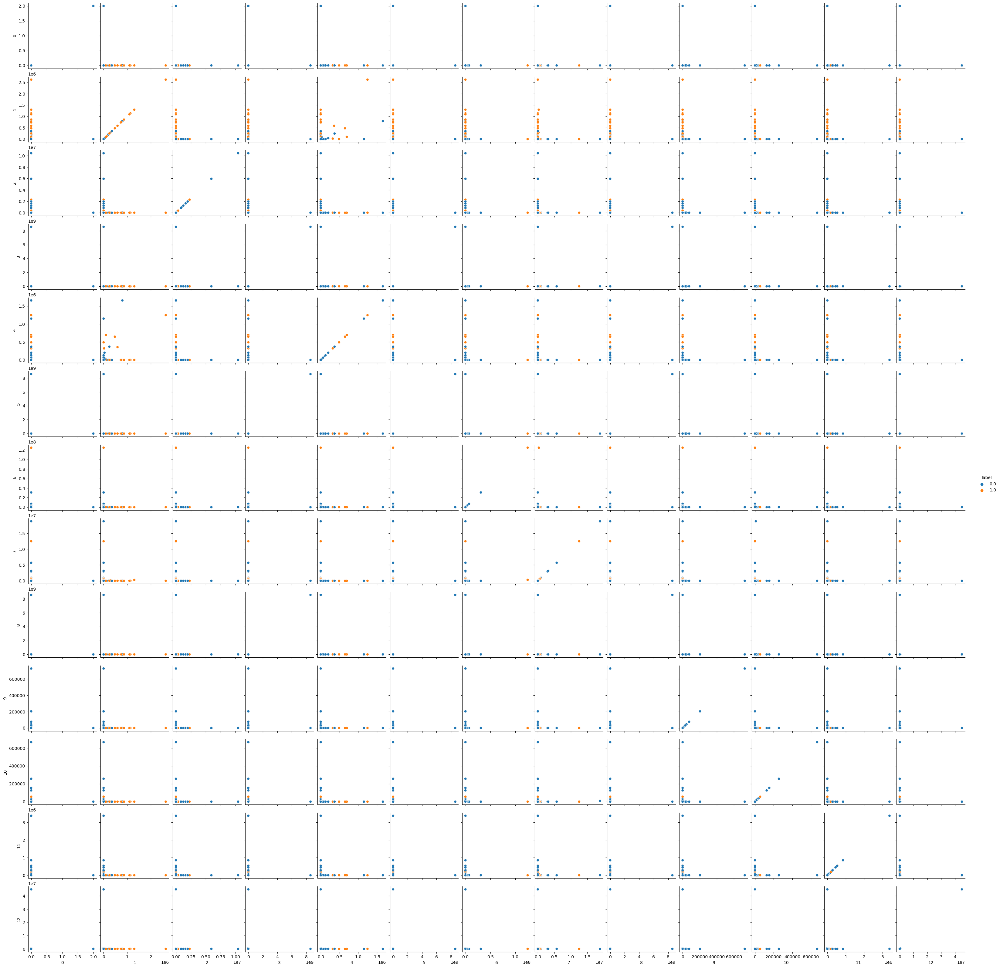

In [6]:
n = math.floor(math.sqrt(170))

# Rearrange the feature indices to make the last n feature had higher CV
selected_feature_index = np.argpartition(train_cv, -n)[-n:]
df_selected = pd.DataFrame(X_train[:, selected_feature_index])
df_label = pd.DataFrame({'label':y_train})
df_selected = pd.concat([df_selected, df_label], axis=1)
print('Scatterplots')
sactter_plot = sns.pairplot(df_selected, hue='label', diag_kind=None)
plt.show(sactter_plot)


Boxplots


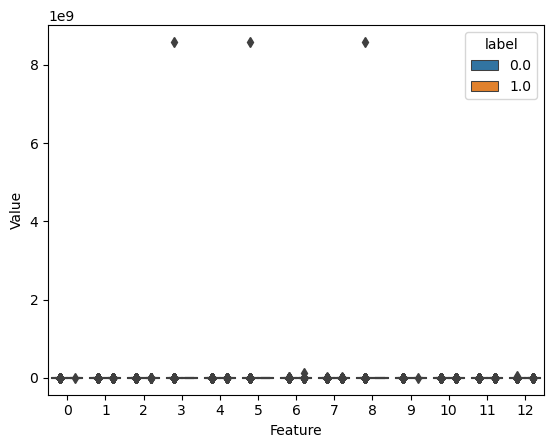

In [7]:
print('Boxplots')
df_long = pd.melt(df_selected, "label", var_name="Feature", value_name="Value")
boxplots = sns.boxplot(data=df_long, hue='label', x='Feature', y='Value')
plt.show(boxplots)

### Can you draw conclusions about significance of those features, just by the scatter plots? <br>
Ans: Looks like feature 1 and feature 4 show some infotmation for classification.

#### (v) Is this data set imbalanced?

In [8]:
positive_count = y_train[np.where(y_train == 1)].size + y_test[np.where(y_test == 1)].size
negative_count = y_train[np.where(y_train == 0)].size + y_test[np.where(y_test == 0)].size
print('Number of positive data: ', positive_count)
print('Number of negative data: ', negative_count)

Number of positive data:  1375
Number of negative data:  74625


Ans: Yes, it's imbalanced.

### (c) Train a random forest

In [9]:
clf = RandomForestClassifier(random_state=0, bootstrap=True, oob_score=True)
clf.fit(X_train, y_train)

predicts_train = clf.predict(X_train)
predicts_test = clf.predict(X_test)

### Train Result

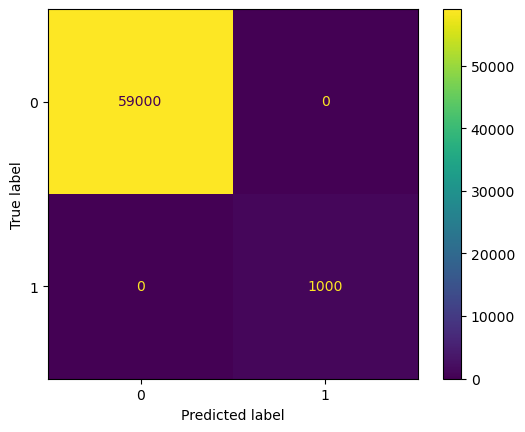

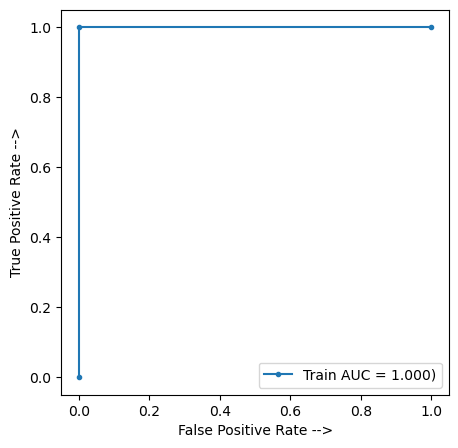

Misclassification rate: 0.0


In [10]:
# Train result
cm = confusion_matrix(y_train, predicts_train)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_train, predicts_train)
train_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Train AUC = %0.3f)' % train_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

error_rate = zero_one_loss(y_train, predicts_train)
print('Misclassification rate: '+str(error_rate))

### Test Result

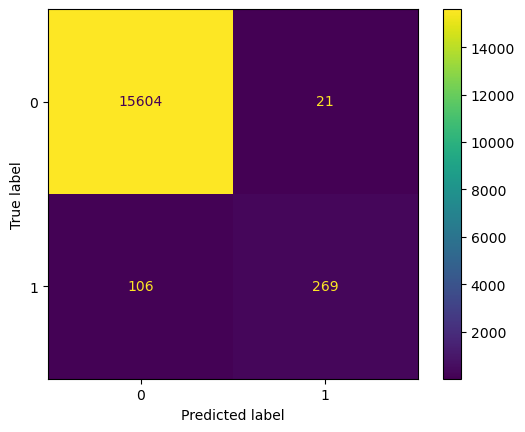

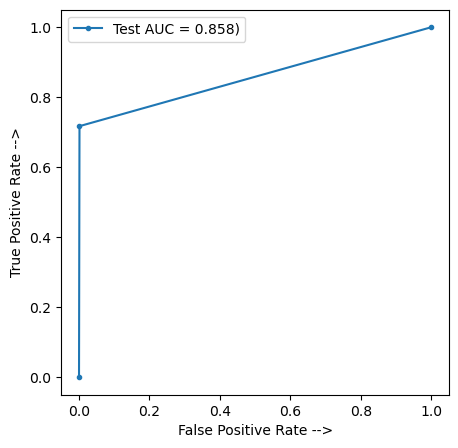

Misclassification rate: 0.007937500000000042


In [11]:
# Test result
cm = confusion_matrix(y_test, predicts_test)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_test, predicts_test)
test_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Test AUC = %0.3f)' % test_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

error_rate = zero_one_loss(y_test, predicts_test)
print('Misclassification rate: '+str(error_rate))

### (d) Research class imbalance in random forest

In [12]:
clf = BalancedRandomForestClassifier(random_state=0, bootstrap=True, oob_score=True, class_weight='balanced')
clf.fit(X_train, y_train)

predicts_train = clf.predict(X_train)
predicts_test = clf.predict(X_test)

c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\imblearn\ensemble\_forest.py:546: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\imblearn\ensemble\_forest.py:558: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\imblearn\ensemble\_forest.py:813: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


### Train result for balanced random forest

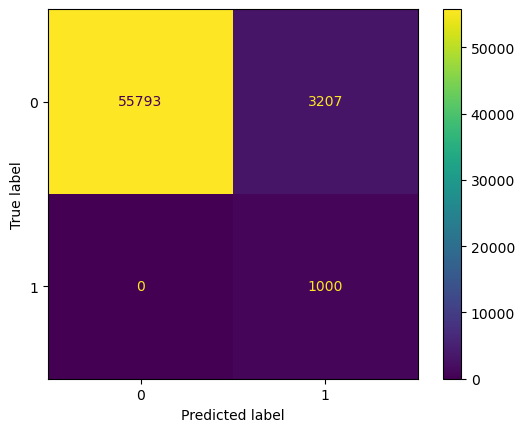

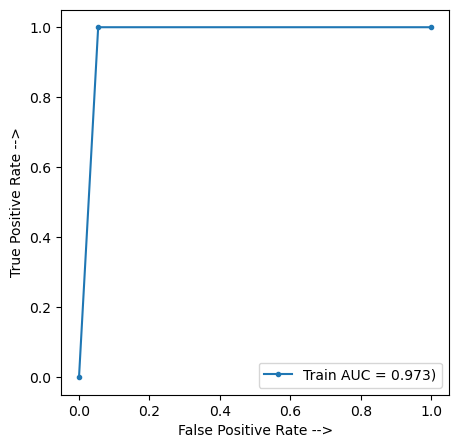

Misclassification rate: 0.05345


In [13]:
# Train result
cm = confusion_matrix(y_train, predicts_train)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_train, predicts_train)
train_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Train AUC = %0.3f)' % train_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

error_rate = zero_one_loss(y_train, predicts_train)
print('Misclassification rate: '+str(error_rate))

### Test result for balanced random forest

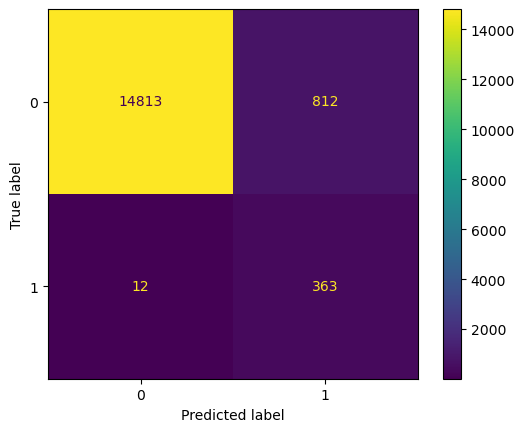

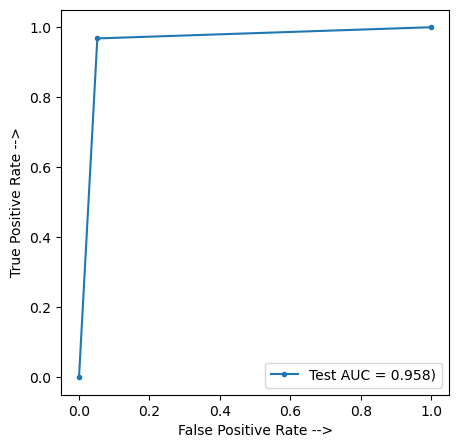

Misclassification rate: 0.05149999999999999


In [14]:
# Test result
cm = confusion_matrix(y_test, predicts_test)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_test, predicts_test)
test_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Test AUC = %0.3f)' % test_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

error_rate = zero_one_loss(y_test, predicts_test)
print('Misclassification rate: '+str(error_rate))

### Compare the results with those of 1c. <br>
Ans: Training result is a little bit worse than imblanced random forest. However, the AUC of test set is much better. 


### (e) XGBoost and Model Trees

In [15]:
alphas = [0.1, 0.01, 0.001, 0.0001]
best_alpha = None
best_score = float('-inf')

for alpha in alphas:
    clf = xgb.XGBClassifier(objective='binary:logistic', reg_alpha=alpha, verbosity=0, use_label_encoder=False)
    score = np.mean(cross_val_score(clf, X_train, y_train, cv=5))
    if score > best_score:
        best_score = score
        best_alpha = alpha

clf = xgb.XGBClassifier(objective='binary:logistic', reg_alpha=best_alpha, verbosity=0, use_label_encoder=False)
clf.fit(X_train, y_train)
predicts_train = clf.predict(X_train)
predicts_test = clf.predict(X_test)

c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\c

### Train result

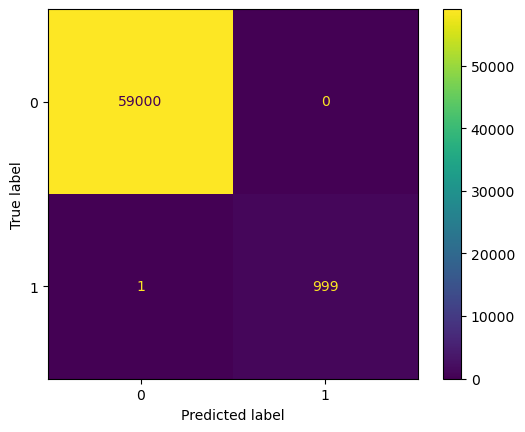

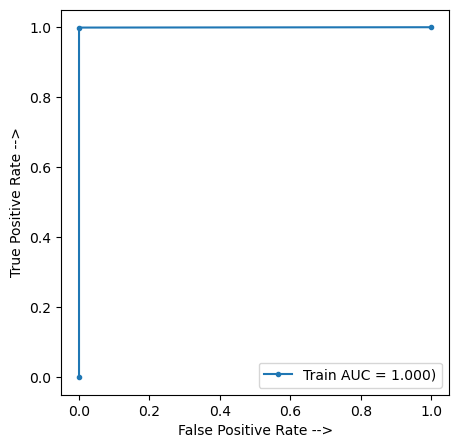

In [16]:
# Train result
cm = confusion_matrix(y_train, predicts_train)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_train, predicts_train)
train_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Train AUC = %0.3f)' % train_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

### Test Result

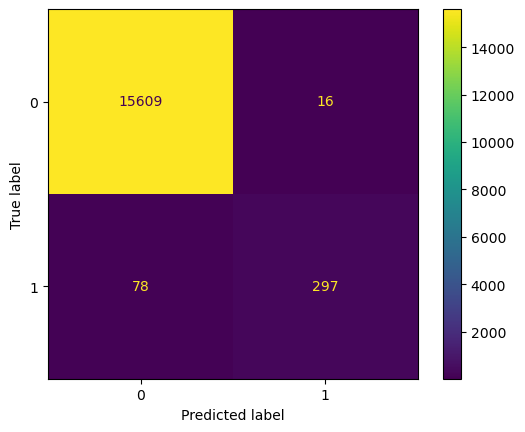

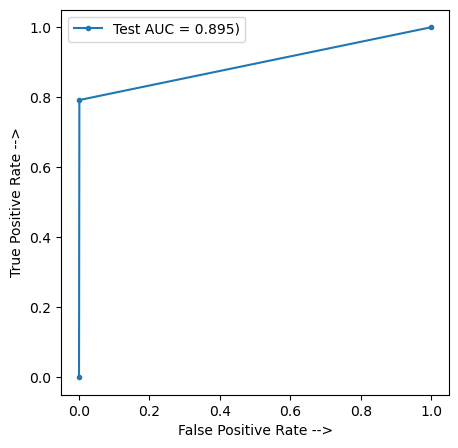

In [17]:
# Test result
cm = confusion_matrix(y_test, predicts_test)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_test, predicts_test)
test_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Test AUC = %0.3f)' % test_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

### (f) Use SMOTE to pre-process your data

In [18]:
alphas = [0.1, 0.01, 0.001, 0.0001]
best_loss = float('inf')
best_alpha = None

for alpha in alphas:
    error_rate=0
    kf = KFold(n_splits=5)
    for train_index, val_index in kf.split(X_train):
        cur_X_train, X_val = X_train[train_index], X_train[val_index]
        cur_y_train, y_val = y_train[train_index], y_train[val_index]
        oversample = SMOTE()
        cur_X_train, cur_y_train = oversample.fit_resample(cur_X_train, cur_y_train)

        clf = xgb.XGBClassifier(objective='binary:logistic', reg_alpha=alpha, verbosity=0, use_label_encoder=False)
        clf.fit(cur_X_train, cur_y_train)
        predicts_val = clf.predict(X_val)
        error_rate += zero_one_loss(y_val, predicts_val)
    
    avg_loss = error_rate / 5
    if avg_loss < best_loss:
        best_loss = avg_loss
        best_alpha = alpha

c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\c

In [19]:
oversample = SMOTE()
smote_X_train, smote_y_train = oversample.fit_resample(X_train, y_train)
clf = xgb.XGBClassifier(objective='binary:logistic', reg_alpha=best_alpha, verbosity=0, use_label_encoder=False)
clf.fit(smote_X_train, smote_y_train)
predicts_train = clf.predict(X_train)
predicts_test = clf.predict(X_test)

c:\Users\chun\anaconda3\envs\DS552\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


### SMOTE Train Result

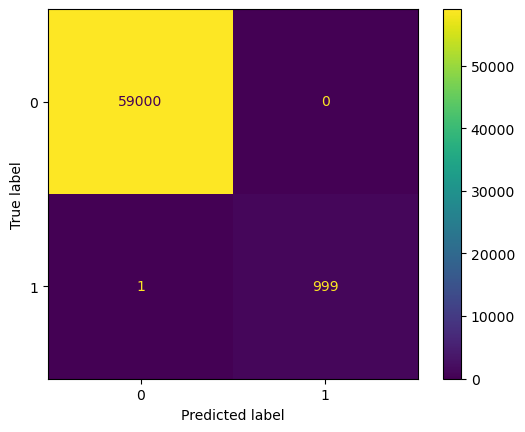

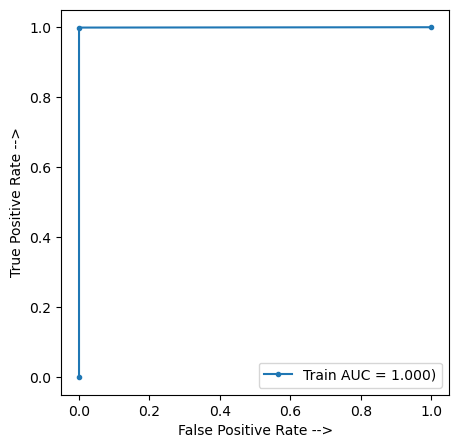

In [20]:
# Train result
cm = confusion_matrix(y_train, predicts_train)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_train, predicts_train)
train_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Train AUC = %0.3f)' % train_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

### SMOTE Test Result

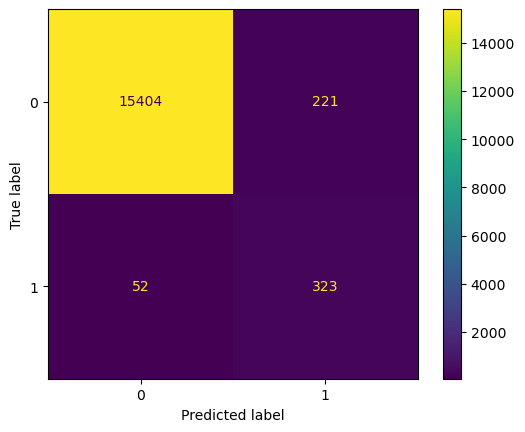

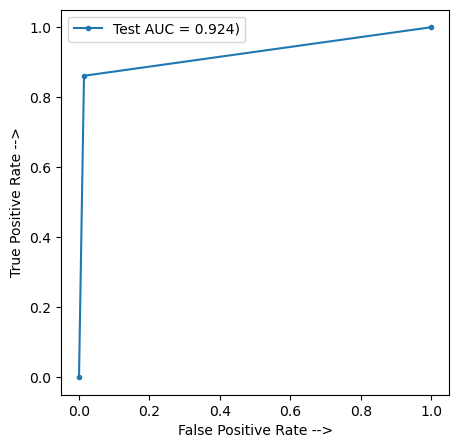

In [21]:
# Test result
cm = confusion_matrix(y_test, predicts_test)
cm_display = ConfusionMatrixDisplay(cm).plot()

fpr, tpr, threshold = roc_curve(y_test, predicts_test)
test_auc = auc(fpr, tpr)
plt.figure(figsize=(5, 5), dpi=100)
plt.plot(fpr, tpr, marker='.', label='Test AUC = %0.3f)' % test_auc)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.legend()
plt.show()

###  Compare the uncompensated case with SMOTE case. <br>
Ans: Based on the test result comparision, SMOTE result is better.


## 2. ISLR 6.6.3

__(a)__ Decrease steadily -- As the value of s increases, the restriction on the β coefficients weakens, leading to a decrease in the Residual Sum of Squares (RSS) until we approach the solution obtained through ordinary least squares. <br>
__(b)__ Decreases initially -- Stop decrese due to the overfitting. <br>
__(c)__ Steadily increase -- The variance increases as the model becomes more flexible and responsive to the training dataset. <br>
__(d)__ Steadily decrease -- The bias decreases as the model becomes more flexible and responsive to the training dataset.<br>
__(e)__ Remains constan -- The irreducible error is the part of the error that cannot be reduced by any model because it arises from inherent noise in the data.<br>

## 3. ISLR 6.6.5

__(a)__ $$ \min_{\beta} \{ (y_1 - \beta_1 x_{11} - \beta_2 x_{11})^2 + (-y_1 - \beta_1 x_{11} - \beta_2 x_{11})^2 + \lambda (\beta_1^2 + \beta_2^2) \} $$ <br>
__(b)__ 
In this setting, due to the symmetry and conditions given, differentiation and optimization will lead to the conclusion that $$  β̂1 = β̂2. $$ <br>
__(c)__ $$ \min_{\beta} \{ (y_1 - \beta_1 x_{11} - \beta_2 x_{11})^2 + (-y_1 - \beta_1 x_{11} - \beta_2 x_{11})^2 + \lambda (|\beta_1| + |\beta_2|) \}$$ <br>
__(d)__ 
The lasso method doesn't give us just one single answer. Since the lasso technique involves a specific type of penalty on the coefficients, we can end up with many different pairs of coefficients for β̂1 and β̂2 that are considered "best" according to the lasso's rules. <br>

## 4. ISLR 8.4.5

- Majority Vote Approach: the class will be "Red" as it has 6 votes compared to 4 votes for Green. <br>
Average Probability Approach: average probability = $$ \frac{0.1 + 0.15 + 0.2 + 0.2 + 0.55 + 0.6 + 0.6 + 0.65 + 0.7 + 0.75}{10}\ $$ = 0.435 --> "Green"

## 5. ISLR 9.7.3

__(a)__ __(b)__
- Given equation of a line:

$$y = mx + c$$

- And given X1, X2, m=1 and c=-0.5, we have:

$$ X_2-X_1 + 0.5 = 0$$

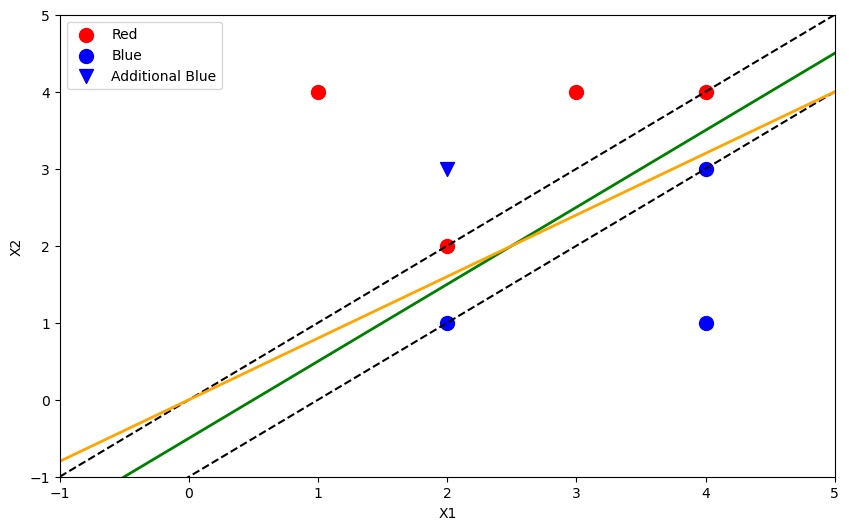

In [22]:
# Setting up the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Define the range for the plot
ax.set_xlim([-1, 5])
ax.set_ylim([-1, 5])

# Labeling the axes
ax.set_xlabel('X1')
ax.set_ylabel('X2')

# Plotting the red and blue points
red_x = [3, 2, 4, 1]
red_y = [4, 2, 4, 4]
blue_x = [2, 4, 4]
blue_y = [1, 3, 1]

ax.scatter(red_x, red_y, color='red', s=100)  # s is size of the points
ax.scatter(blue_x, blue_y, color='blue', s=100)
ax.scatter(2, 3, color='blue', s=100, marker='v')  # marker 'v' is a triangle_down

# Plotting the lines
x_vals = np.array(ax.get_xlim())
y_vals_optimal = -0.5 + 1 * x_vals
y_vals_margin1 = -1 + 1 * x_vals
y_vals_margin2 = 0 + 1 * x_vals
y_vals_nonoptimal = 0 + 0.8 * x_vals

ax.plot(x_vals, y_vals_optimal, color='green', linewidth=2)
ax.plot(x_vals, y_vals_margin1, '--', color='black')
ax.plot(x_vals, y_vals_margin2, '--', color='black')
ax.plot(x_vals, y_vals_nonoptimal, color='orange', linewidth=2)

# Adding legend
ax.legend(["Red", "Blue", "Additional Blue"], loc='upper left')

plt.show()

__(c)__

  - Class Red if $X_2-X_1 + 0.5 > 0$ and Blue otherwise. $\beta_0=0.5 ; \beta_1=-1; \beta_2=1$

__(d)__ __(e)__ 

  - See above chart.

__(f)__

  - Observation seven is distant from the support vectors and won't influence the maximal margin classifier, even if moved slightly closer. Only support vectors impact the classifier.

__(g)__ __(h)__
  - See above chart.